
#  Project 05 : Vehicle Detection
-----


### Histogram of Oriented Gradients (HOG)

---

[image01]: ./Images/car_hog.jpg "car_hog"
[image02]: ./Images/non_car_hog.jpg "non_car_hog"
[image03]: ./Images/car_spatial.jpg "car_spatial"
[image04]: ./Images/non_car_spatial.jpg "non_car_spatial"
[image05]: ./Images/car_color_hist.jpg "car_color_hist"
[image06]: ./Images/non_car_color_hist.jpg "non_car_color_hist"


#### 1. Explain how (and identify where in your code) you extracted HOG features from the training images.

 - I used hog feature as one of the feature 
 - The extraction of hog feature is done by function **`get_hog_features()`**
 - Used **`skimage.feature`** package's **`hog`** function for extracting hog features 
 - In classifier I used hog feature for every channel of the image to get as much information as I can
 - For visualization I have converted the image to gray scale and displayed the hog original image and hog image
 - Below Is the example of the original image of cars and their hog images
 
 
 ![HOG][image01]

 - Below Is the example of the original image of non-cars and their hog images


 ![HOG][image02]


#### 2. Explain how you settled on your final choice of HOG parameters.

 - I did not do much experiment with the parameters
 - Following parameter I used :
            - Number of orientation bins : 11
            - Size (in pixels) of a cell : 16
            - Number of cells in each block : 2
 - These parameters are defined in code cell number 23

#### 3. Describe how (and identify where in your code) you trained a classifier using your selected HOG features (and color features if you used them).

 - I represented the images into YUV Space
 - I also used spatial and histogram hog features
 - Spatial features I used were of dimension 32*32 which were flatten
 ### **Below are examples of spatial features of car images**
 
  ![HOG][image03]

 ### **Below are examples of spatial features of non-car images**
 
  ![HOG][image04]

 ###  **I used color histogram features of each channel**
 ###  **Below are examples of color histogram features of car images**

    ![HOG][image05]

 ### **Below are examples of color histogram features of non-car images**
 
   ![HOG][image06]
 
 - Each Data point had **4356** features when hog, sptial, color histogram features were concatenated 
 - Used a Linear SVM as a classifier
 - By these features and Linear SVM I got an accuracy of **98.42** on test images

### Sliding Window Search

---




[image07]: ./Images/restrict_search_window.jpg "restrict_search_window"
[image08]: ./Images/Results.jpg "Results"

#### 1. Describe how (and identify where in your code) you implemented a sliding window search.  How did you decide what scales to search and how much to overlap windows?
 - I restrcited my window search from **y-start co-ordinate at 400** and **y-stop co-ordinate at 656**
 - I performed Sliding Window search 3 times with same **y-start co-ordinate and y-stop co-ordinate** but different scale
 - Below is example of **y-start co-ordinate and y-stop co-ordinate** to restrict the window search
   ![SWS][image07]
 - I initially used a scale of 1.0 but it did not predict all the cars
 - So Used Sliding Windows with following scaling factors : [2.0, 1.0, 1.5]
 
 
#### 2. Show some examples of test images to demonstrate how your pipeline is working.  What did you do to optimize the performance of your classifier?
 - Below are Examples of Sliding Windows with scaling factor : : [2.0, 1.0, 1.5]
   ![SWS][image08]

    

### Video Implementation
----

[image09]: ./Images/Results.jpg "Results"
[image10]: ./Images/heatmap.jpg "heatmap"
[image11]: ./Images/after_thresholding.JPG "after_thresholding"
[image12]: ./Images/label_box.JPG "label_box"
[image13]: ./Images/final_result.JPG "label_box"


#### 1. Provide a link to your final video output.  Your pipeline should perform reasonably well on the entire project video (somewhat wobbly or unstable bounding boxes are ok as long as you are identifying the vehicles most of the time with minimal false positives.)
Here's a [link to my video result](./project_video_output.mp4)



#### 2. Describe how (and identify where in your code) you implemented some kind of filter for false positives and some method for combining overlapping bounding boxes.
 - I recorded the positions of positive detections in each frame of the video.  
 - From the positive detections I created a heatmap and then thresholded that map to identify vehicle positions. 
 - I then used `scipy.ndimage.measurements.label()` to identify individual blobs in the heatmap.  
 - I then assumed each blob corresponded to a vehicle.  I constructed bounding boxes to cover the area of each blob detected.  
 - Here's an example result showing the heatmap from a series of frames of video, the result of `scipy.ndimage.measurements.label()` and the bounding boxes then overlaid on the last frame of video:

### Here is an image and their corresponding heatmaps:

  #### Original Image
  ![VI][image09]
  
  #### Heatmap Image
  ![VI][image10]

  #### Thresholded Heatmap Image
  ![VI][image11]

### Here is the output of `scipy.ndimage.measurements.label()` on the integrated heatmap from all six frames:
  ![VI][image12]


### Here the resulting bounding boxes are drawn onto the last frame in the series:
  ![VI][image13]



### Discussion
-----

#### 1. Briefly discuss any problems / issues you faced in your implementation of this project.  Where will your pipeline likely fail?  What could you do to make it more robust?


- The pipeline fails where there is a overlap between two cars it detects only on bounding box for the two cars
- If the car changes lane very quickly then the classifier might not recognize the car
- I would have used a neural network approack like YOLO ot R-CNN for vehicle detection


In [1]:
import os
import cv2
import glob
import time
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from skimage.feature import hog
from sklearn.svm import LinearSVC
from scipy.ndimage.measurements import label
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from mpl_toolkits.mplot3d.axes3d import Axes3D, get_test_data
from matplotlib import cm


%matplotlib inline

In [2]:
def bin_spatial(img, size=(16, 16)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

In [3]:
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # ====================================================================
    # Compute the histogram of the color channels separately
    # ====================================================================
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    
    # =========================================================
    # Concatenate the histograms into a single feature vector
    # =========================================================
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    
    # ====================================================================
    # Return the individual histograms, bin_centers and feature vector
    # ====================================================================
    return hist_features

In [4]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    """
    Returns the HOG Feature of the image

    Parameters
    ----------
    img : numpy array
          image whose hog features are to be obtained
    
    orient : int
             number of orientation
    
    pix_per_cell : int
                   number of pixels per cell 
    
    cell_per_block : int
                     number of cells per block
    
    vis : boolean
          Whether to do visulaization or not
    
    feature_vec         
        

    Returns
    -------
    features : numpy array
               hog features

    hog_image : numpy array
                hog_image for hog visualization
    """
    # =====================================
    # Call with two outputs if vis==True
    # =====================================
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    
    # =====================================
    # Otherwise call with one output
    # =====================================
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [5]:
def get_feature_image(image, color_space):
    """
    Converts the image to particular color space

    Parameters
    ----------
    color_space : string
                  color space to which the image has to be converted
    
    image : numpy array
            image that is to be converted to a particular color space

    Returns
    -------
    feature_image : numpy array
                    image which is a converted image to the color space

    """
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: 
        feature_image = np.copy(image)
        
    return feature_image

In [6]:
def extract_features(images, color_space='RGB', spatial_size=(32, 32),
                     hist_bins=32, orient=9, pix_per_cell=8, 
                     cell_per_block=2, hog_channel='ALL', 
                     spatial_feat=True, hist_feat=True, 
                     hog_feat=True):
    # ============================================
    # Create a list to append feature vectors to
    # ============================================
    features = []
    
    # ====================================
    # Iterate through the list of images
    # ====================================
    for image in images:
        img_features = []
        
        # ==========================================
        # apply color conversion if other than 'RGB'
        # ===========================================
        # print("get spatial feature image")
        feature_image = get_feature_image(image, color_space)
        if spatial_feat == True:
            # ========================
            # Apply Spatial Features
            # ========================
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            img_features.append(spatial_features)
            
        # print("get hist feature image")

        if hist_feat == True:
            # ====================
            # Apply color_hist()
            # ====================
            hist_features = color_hist(feature_image, nbins=hist_bins)
            img_features.append(hist_features)
            
        # print("get hog feature image")

        if hog_feat == True:
            # ========================================================
            # Call get_hog_features() with vis=False, feature_vec=True
            # ========================================================
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # ===================================================
            # Append the new feature vector to the features list
            # ===================================================
            img_features.append(hog_features)
            
        features.append(np.concatenate(img_features))
        
    # ==============================
    # Return list of feature vectors
    # ==============================
    return np.array(features)

In [7]:
def display_data(data, label_name):
    """
    Displaying images 
    Parameters
    ----------
    data : numpy array or list
           contains images data that is to be displayed
           
    label_name : string
                 matplotlib title
    """
    plt.figure(figsize=(16, 21))
    for i in range(DISPLAY_NUMBER):
        plt.subplot(DISPLAY_NUMBER, 4, i+1)
        plt.imshow(data[i+1]) 
        plt.title(label_name+"_"+str(i))
        plt.tight_layout()
        plt.axis('off') 
    plt.show()

In [8]:
def visualize_hog(data, orient=9, 
                  pix_per_cell=8, 
                  cell_per_block=2):
    
    
    plt.figure(figsize=(60, 60))
    
    for i in range(DISPLAY_NUMBER//2):
        features, hog_image = hog(cv2.cvtColor(data[i], cv2.COLOR_BGR2GRAY), orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=True, feature_vector=True)
    
        
        plt.subplot(DISPLAY_NUMBER, 2, 2*i+1)
        plt.title("Original Image", fontsize=80)
        plt.imshow(data[i]) 
        plt.axis('off')
        plt.tight_layout()
        plt.subplot(DISPLAY_NUMBER, 2, 2*i+2)
        plt.title("Hog Image", fontsize=80)
        plt.imshow(hog_image) 
        plt.axis('off')

         
    plt.show()
        
    

In [9]:
def visualize_spatial_features(data):
    plt.figure(figsize=(100, 100))
    
    for i in range(DISPLAY_NUMBER//2):
        spatial_feature = bin_spatial(data[i], size=(32, 32))
        spatial_feature = spatial_feature.reshape((spatial_feature.shape[0], 1))
        plt.subplot(DISPLAY_NUMBER, 2, 2*i+1)
        plt.title("Original Image", fontsize=80)
        plt.imshow(data[i]) 
        plt.axis('off')
        plt.tight_layout()
        plt.subplot(DISPLAY_NUMBER, 2, 2*i+2)
        plt.title("Spatial Feature Image", fontsize=80)
        plt.plot(spatial_feature) 
        plt.axis('off')

         
    plt.show()
        
    

In [10]:
def visualize_color_spaces(data):
    fig = plt.figure(figsize=(60, 60))

    for i in range(DISPLAY_NUMBER//2):
        ax = fig.add_subplot(DISPLAY_NUMBER, 2, 2*i+1)    
        plt.title("Original Image", fontsize=30)
        ax.imshow(data[i]) 
        plt.axis('off')
        plt.tight_layout()
        
        ax = fig.add_subplot(DISPLAY_NUMBER, 2, 2*i+2, projection='3d')
        ax.scatter(data[i][:, :, 0], data[i][:, :, 1], data[i][:, :, 2], s=20, c=None, depthshade=True)
        plt.title("Color Space", fontsize=30)
        plt.tight_layout()     
    plt.show()

In [11]:
def draw_line(image, pt1, pt2, lineThickness):

    cv2.line(image, pt1, pt2, (255, 0, 0), lineThickness)
    return image


In [12]:
def visualize_color_hist(img, nbins=32, bins_range=(0, 256)):
    """
    Calculates the Color Histogram of all the channels of the image and displays it for Visulaization  

    Parameters
    ----------
    img : numpy array
          image whose Color Histogram is to be calculates
    
    nbins : int
            number of bins in for a particular range 

    bins_range : int
                 bin range of the histogram 

   
    """
    img = img * 255.0
    rhist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    ghist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    bhist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    
    # =========================
    # Generating bin centers
    # =========================
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))

    
    # ================================================================
    # Display the Features  
    # ================================================================
    fig = plt.figure(figsize=(25,10))
    plt.subplot(311)
    plt.bar(bin_centers, rhist[0])
    plt.xlim(0, 256)
    plt.title('R Histogram', fontsize = 50)
    plt.xticks(fontsize = 50)
    plt.yticks(fontsize = 30)
    plt.subplot(312)
    plt.bar(bin_centers, ghist[0])
    plt.xlim(0, 256)
    plt.title('G Histogram', fontsize = 50)
    plt.xticks(fontsize = 50)
    plt.yticks(fontsize = 30)
    plt.subplot(313)
    plt.bar(bin_centers, bhist[0])
    plt.xlim(0, 256)
    plt.title('B Histogram', fontsize = 50)
    plt.xticks(fontsize = 50)
    plt.yticks(fontsize = 30)
    fig.tight_layout()


In [13]:
def read_data(path):
    """
    Loads the images and returns the list of images 

    Parameters
    ----------
    path : string
           path from where the images are to be read

    Returns
    -------
    imgs : numpy array
           array of images
    """
    imgs = []
    for root, dirs, files in os.walk(path):
        for filename in files:
            if "png" in filename or "jpg" in filename: 
                img = mpimg.imread(root+"\\"+filename)
                imgs.append(img)
    return np.array(imgs)

In [14]:
# =================================
#  Reading the data
# =================================
NON_VEHICLE_PATH  = "non-vehicles"
VEHICLE_PATH = "vehicles"
TEST_IMG_PATH = "test_images"
DISPLAY_NUMBER = 12
non_vehicles_imgs = read_data(NON_VEHICLE_PATH)
vehicles_imgs = read_data(VEHICLE_PATH)
test_imgs = read_data(TEST_IMG_PATH)

Visualization of VEHICAL data ..........


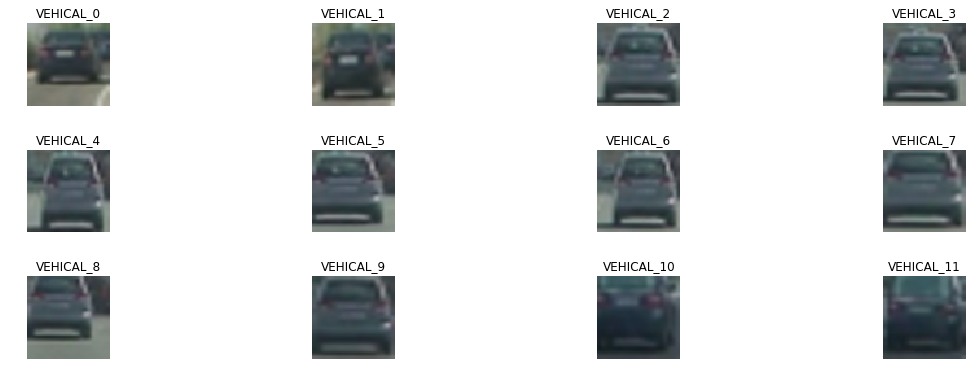

(64, 64, 3)


In [15]:
print("Visualization of VEHICAL data ..........")
display_data(vehicles_imgs, "VEHICAL")
print(vehicles_imgs[0].shape)

Visualization of NON-VEHICAL data ..........


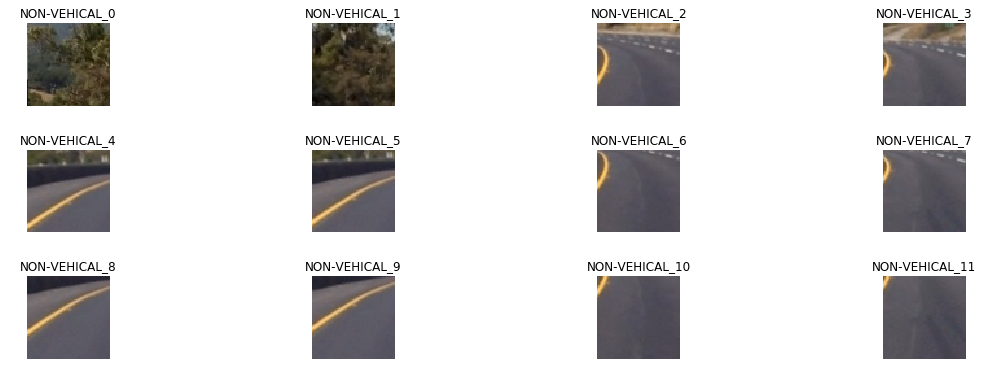

In [16]:
print("Visualization of NON-VEHICAL data ..........")
display_data(non_vehicles_imgs, "NON-VEHICAL")

C:\Users\jaysh\Anaconda3\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


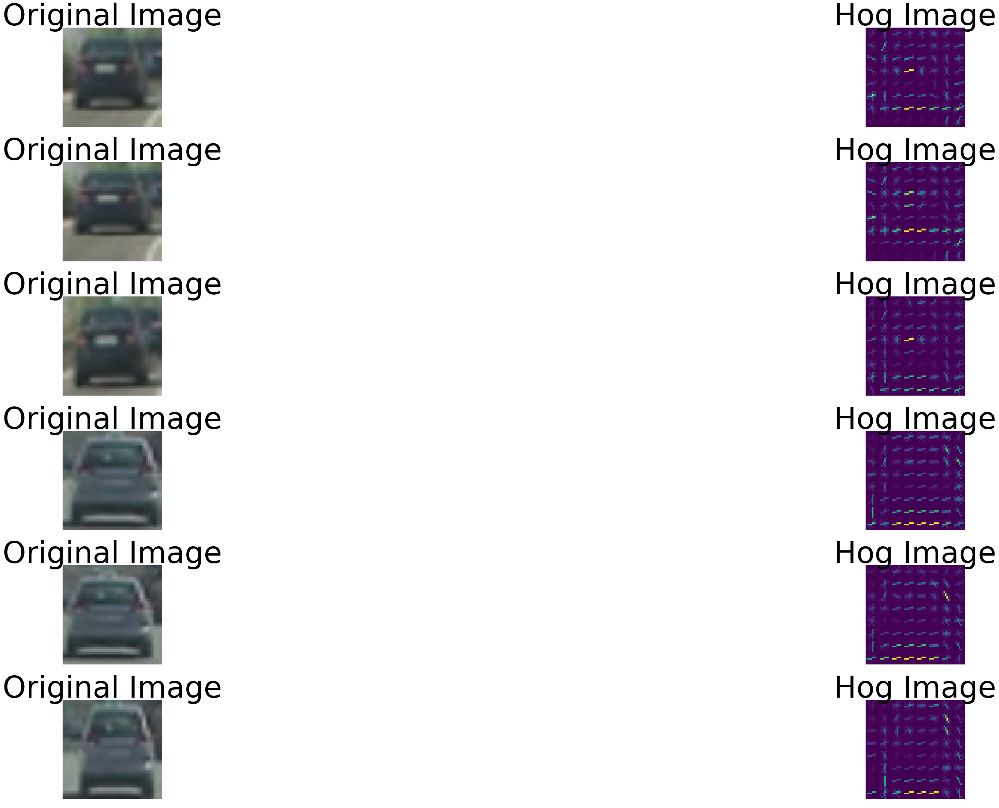

In [17]:
visualize_hog(vehicles_imgs)

C:\Users\jaysh\Anaconda3\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


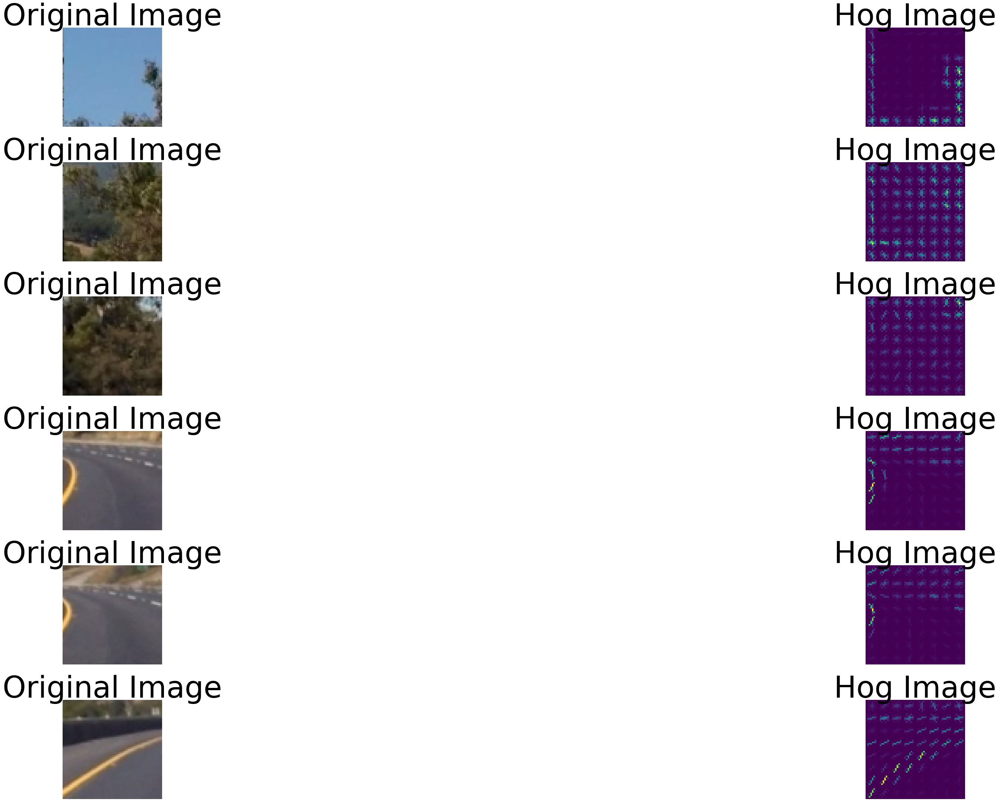

In [18]:
visualize_hog(non_vehicles_imgs)

Spatial Features of Vehicles ..........


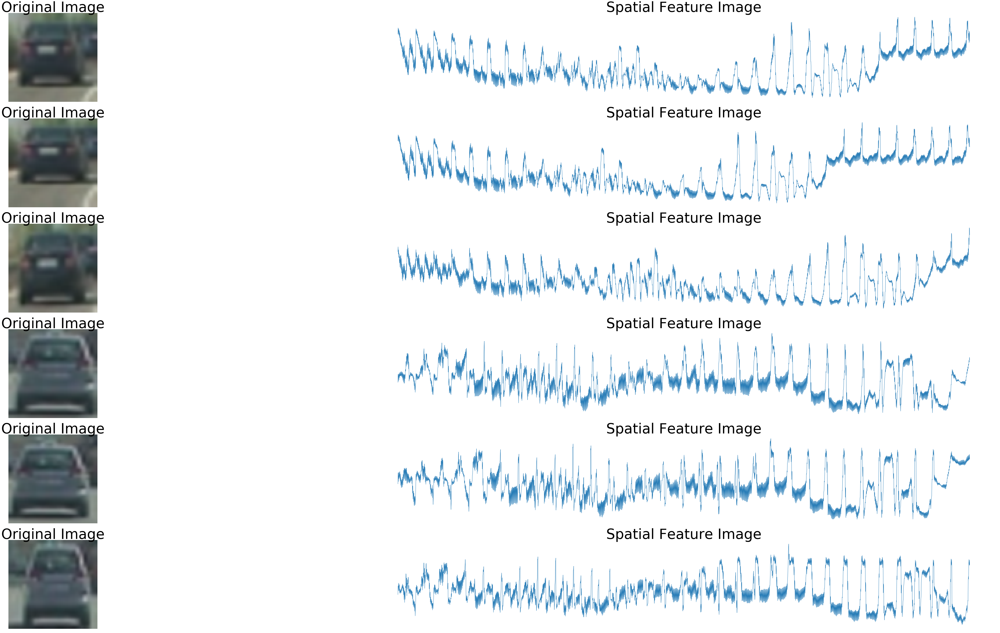

In [19]:
print("Spatial Features of Vehicles ..........")
visualize_spatial_features(vehicles_imgs)

Spatial Features of Non-Vehicales ..........


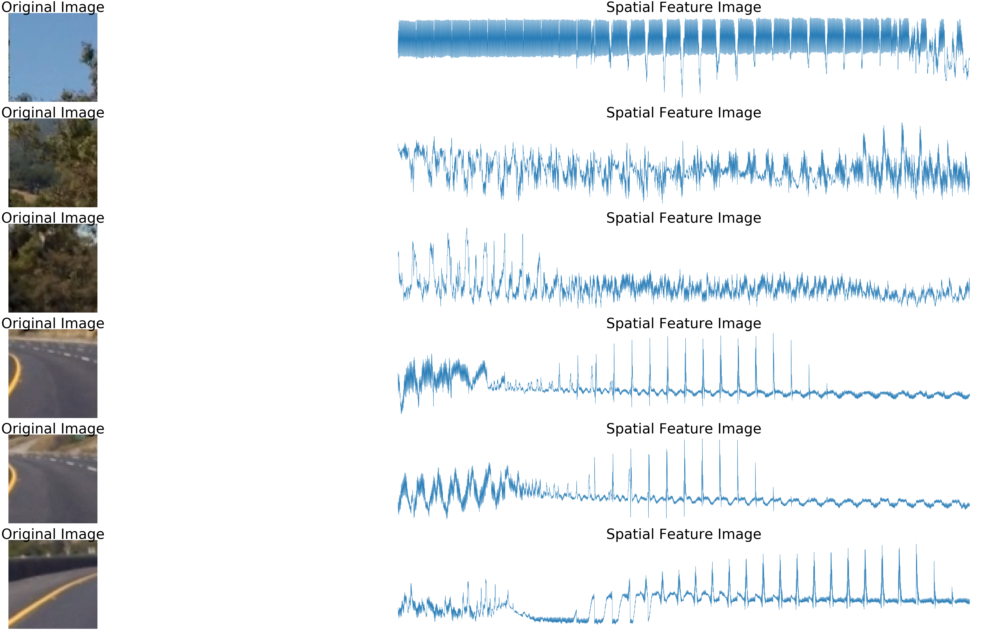

In [20]:
print("Spatial Features of Non-Vehicales ..........")
visualize_spatial_features(non_vehicles_imgs)

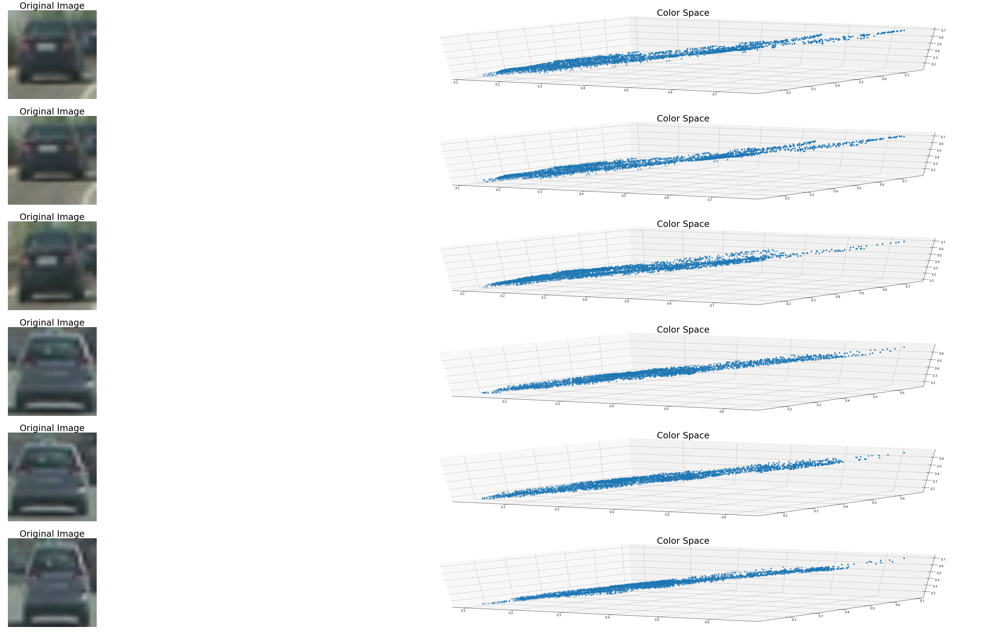

In [21]:
visualize_color_spaces(vehicles_imgs)


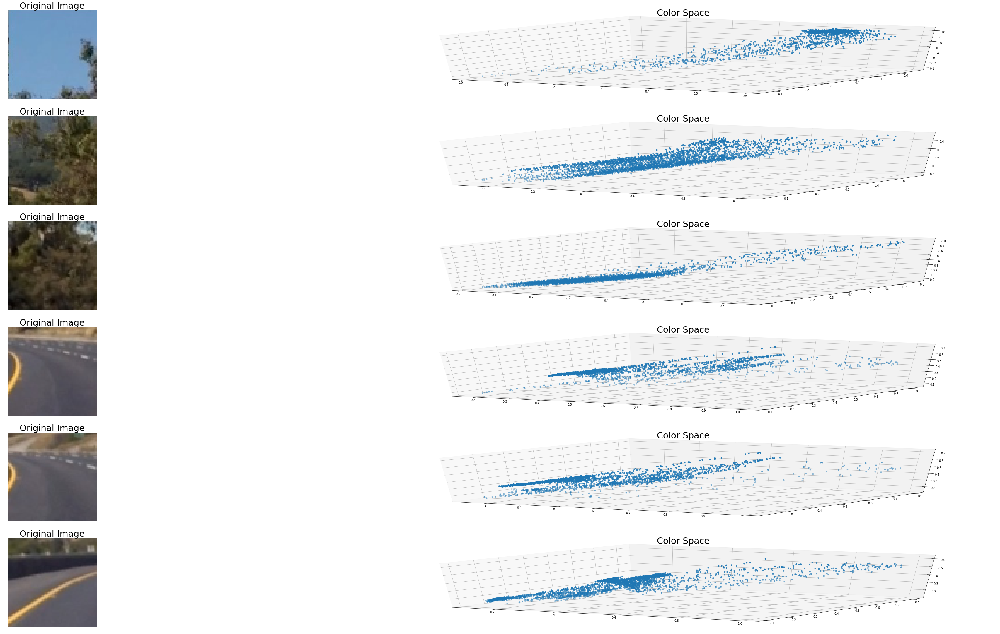

In [22]:
visualize_color_spaces(non_vehicles_imgs)


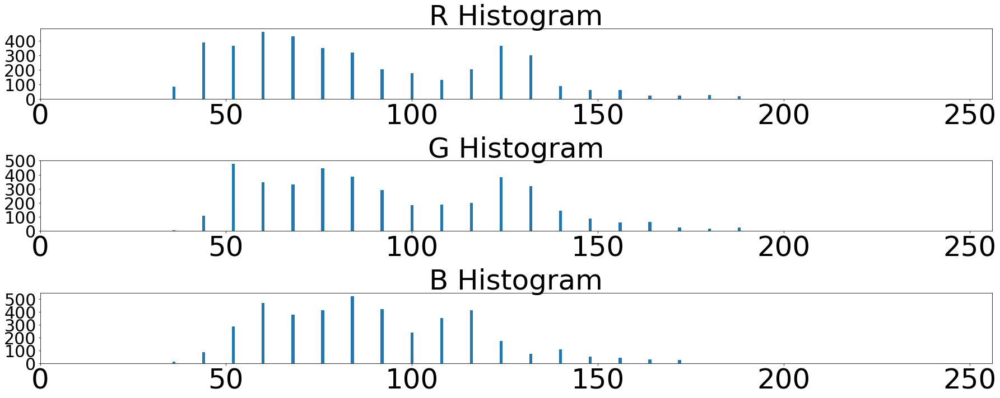

In [23]:
visualize_color_hist(vehicles_imgs[0])

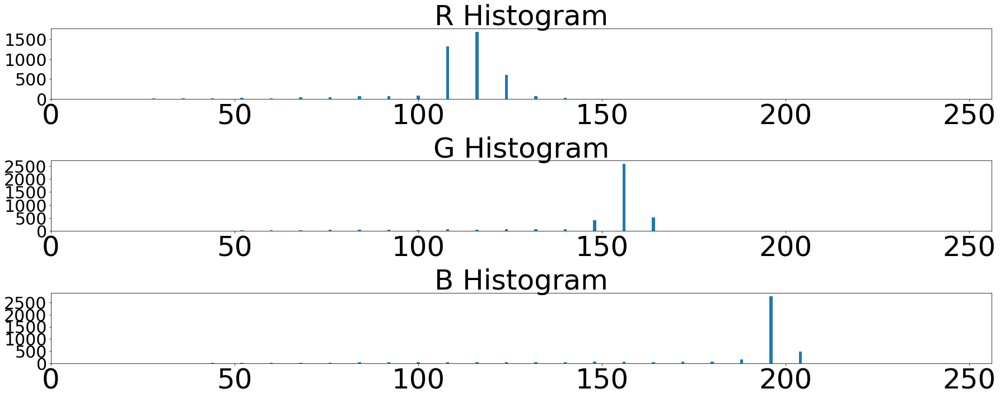

In [24]:
visualize_color_hist(non_vehicles_imgs[0])

In [25]:
# =====================================================
#              Defining the parameters
# =====================================================
colorspace = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11
pix_per_cell = 16
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"


# ==========================================================================================
#                                Extracting Car Features
# ==========================================================================================
car_features = extract_features(vehicles_imgs, color_space=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=True, hist_feat=True)

# ==========================================================================================
#                                Extracting Non-Car Features
# ==========================================================================================
non_car_features = extract_features(non_vehicles_imgs, color_space=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=True, hist_feat=True)


# ==========================================================================================
#               Combining Car and Non-Car Features by stcking them horizontally
# ==========================================================================================
X = np.vstack((car_features, non_car_features)).astype(np.float64)  

# ==========================================================================================
#               Displaying the shapes of Car, Non-Car, Combined Features 
# ==========================================================================================
print("Shape of Car Features", car_features.shape)
print("Shape of Non-Car Features",non_car_features.shape)
print("Shape of combined Car and Non-Car Features",non_car_features.shape)



C:\Users\jaysh\Anaconda3\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Shape of Car Features (8792, 4356)
Shape of Non-Car Features (8968, 4356)
Shape of combined Car and Non-Car Features (8968, 4356)


In [26]:
# =========================================
# Applying pre-processing by normaliation
# Making data zero meand and unit variance
# =========================================
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)



In [29]:
# ==========================
# Define the labels vector
# ==========================
y = np.hstack((np.ones(len(car_features)), np.zeros(len(non_car_features))))

# =====================================================
# Split up data into randomized training and test sets
# =====================================================
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)



# ===================
# Display Results
# ===================
print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))

Using: 11 orientations 16 pixels per cell and 2 cells per block
Feature vector length: 4356


In [30]:
svc = LinearSVC()
strt = time.time()
svc.fit(X_train, y_train)
end = time.time()

print(round(end - strt, 2), 'Seconds to train SVC...')
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

strt=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
end = time.time()
print(round(end-strt, 5), 'Seconds to predict', n_predict,'labels with SVC')

21.25 Seconds to train SVC...
Test Accuracy of SVC =  0.9856
My SVC predicts:  [ 0.  0.  1.  0.  0.  0.  0.  1.  1.  0.]
For these 10 labels:  [ 0.  0.  1.  0.  0.  0.  0.  1.  1.  0.]
0.04412 Seconds to predict 10 labels with SVC


In [31]:
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, cspace):
    """
    - Extracts features of the test image 
    - Performs Sliding Window on the test image
    - Extracts subimage from the test image
    - Makes predictions of the subimage
    
    Parameters
    ----------
    img : numpy array
          test image in which we have to look whether car exists or not
        
    ystart : int
             starting the y-coordinate of the test image from where the sliding window is to be started
            
    ystop : int 
            end the y-coordinate of the test image from where the sliding window is to be stopped
            beyond this coordinate the window can not slide down
    
    scale : float
            scale of the window wrt to the test image based on which the subimge will be extracted
            
    svc : sklearn SVC object instance
          Classifier that will make prediction for every subimage

    
    orient : int
             number of orientations to be considered for extracting hog features
             
    pix_per_cell : int 
                   number of pixel per cell
    
    cell_per_block : int 
                     number of cells per block
    
    spatial_size : tuple
                   image size of the test image whose spatial features will be extracted
    
    hist_bins : int
                number of histogram bins for color histogram features extraction
    
    cspace : string
             color space in which the test iamge is to be represented
    

    Returns
    -------
    imgs : numpy array
           array of images
    """
    rectangles = []
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = get_feature_image(img_tosearch, cspace)   # img_tosearch[:] # convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    # ====================================
    # Define blocks and steps as above
    # ====================================
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # ==================================================================
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    # ==================================================================
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # ==================================================================
    # Compute individual channel HOG features for the entire image
    # ==================================================================
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)


    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # =============================
            # Extract HOG for this patch
            # =============================
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # =============================
            # Extract the image patch
            # =============================
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            # =============================
            # Get color features
            # =============================
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # ====================================
            # Scale features and make a prediction
            # ====================================
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                rectangles.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return rectangles

In [32]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    """
    Draw Boxes on the given image 
    Parameters
    -----------
    img : numpy array 
          image in which the rectangles are to be drawn
           
    bboxes : list
             list of boxes which are to be redrawn in the image
             
    color : tuple
            color of box to be drawn 
    
    thick : int
            thickness of the box
           
    Returns
    ---------
    imcopy : numpy array
             image which has boxes 
    """
    # =========================
    # Make a copy of the image
    # =========================
    imcopy = np.copy(img)
    random_color = False

    # ===================================
    # Iterate through the bounding boxes
    # ===================================
    for bbox in bboxes:
        if color == 'random' or random_color:
            color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
            random_color = True
        #  =======================================
        #  Draw a rectangle given bbox coordinates
        #  =======================================
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)

    
    return imcopy

The window search is restricted between the red lines ......


(-0.5, 1279.5, 719.5, -0.5)

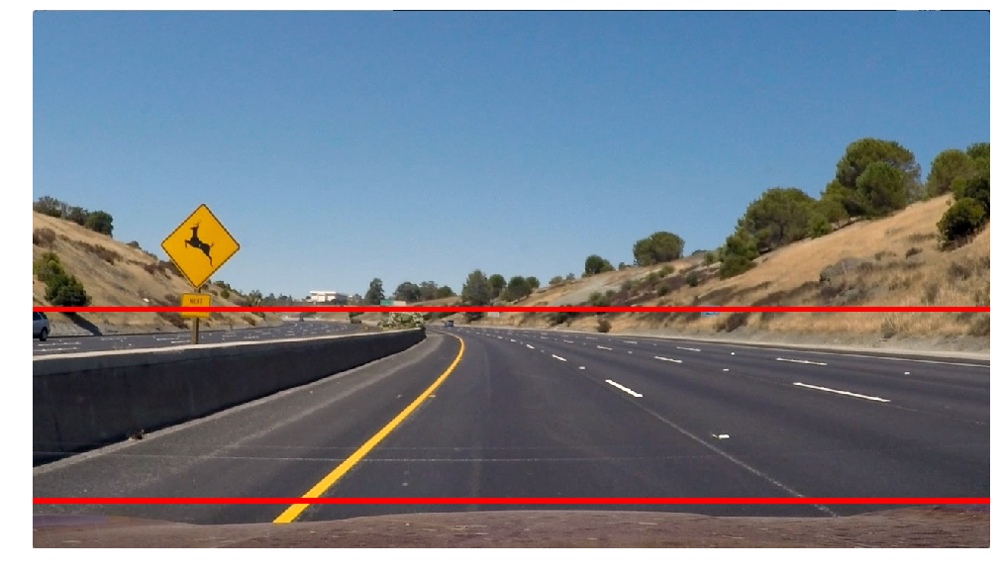

In [33]:
print("The window search is restricted between the red lines ......")
tp_image = draw_line(np.copy(test_imgs[1]), (0, 400), (test_imgs[1].shape[1], 400), 6)
tp_image = draw_line(tp_image, (0, 656), (test_imgs[1].shape[1], 656), 6)
fig = plt.figure(figsize=(25,10))
plt.imshow(tp_image)
plt.axis("off")


In [34]:
ystart = 400
ystop = 656
scale = 1.8
spatial_size = (32, 32)
hist_bins = 32

rectangles = []
rectangles.append(find_cars(test_imgs[0], ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, cell_per_block, 
                     spatial_size, hist_bins, colorspace))

ystart = 400
ystop = 656
scale = 2.0

rectangles.append(find_cars(test_imgs[0], ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, cell_per_block, 
                     spatial_size, hist_bins, colorspace))



ystart = 400
ystop = 656
scale = 1.0

rectangles.append(find_cars(test_imgs[0], ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, cell_per_block, 
                     spatial_size, hist_bins, colorspace))



ystart = 400
ystop = 656
scale = 1.5

rectangles.append(find_cars(test_imgs[0], ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, cell_per_block, 
                     spatial_size, hist_bins, colorspace))

recs = []
for rec in rectangles:
    recs = recs + rec

rectangles = recs[:]


C:\Users\jaysh\Anaconda3\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


(-0.5, 1279.5, 719.5, -0.5)

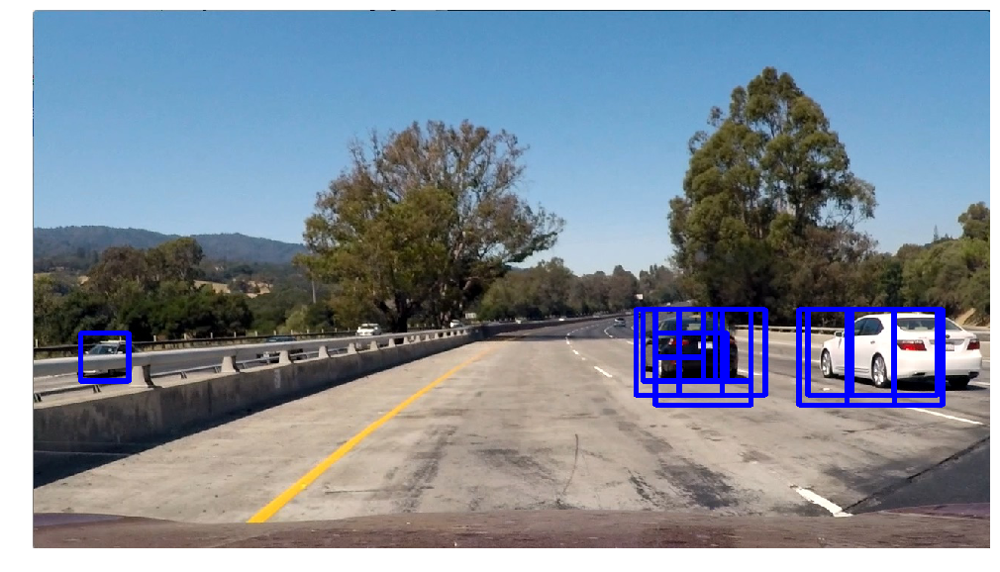

In [35]:
imgk = draw_boxes(test_imgs[0], rectangles, color=(0, 0, 255), thick=6)
fig = plt.figure(figsize=(25,10))
plt.imshow(imgk)
plt.axis("off")

In [36]:
def add_heat(heatmap, bbox_list):
    """
    Adds HeatMap
    Parameters
    -----------
    heatmap : numpy array 
              blank image
           
    bbox_list : list
                list of boxes which are to be added as heatmaps on heatmap image
           
    Returns
    ---------
    heatmap : numpy array
              image with the heatmap
    """
    
    # ==============================
    # Iterate through list of bboxes
    # ==============================
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    return heatmap



(-0.5, 1279.5, 719.5, -0.5)

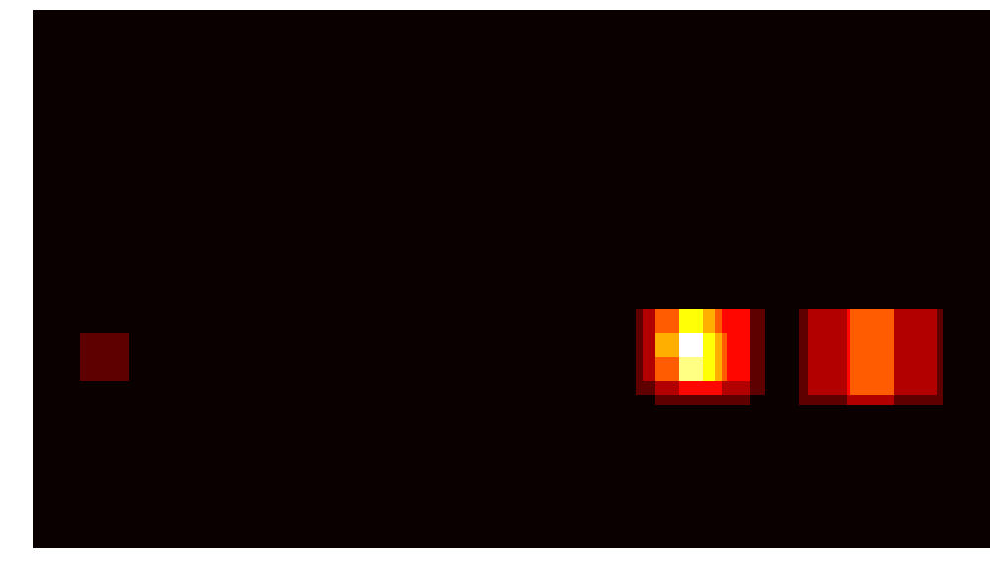

In [42]:
heatmap_img = np.zeros_like(test_imgs[0][:,:,0]).astype(np.float64) 
heatmap_img = add_heat(heatmap_img, rectangles)
plt.figure(figsize=(25,10))
plt.imshow(heatmap_img, cmap='hot')
plt.axis("off")


In [38]:
def apply_threshold(heatmap, threshold):
    """
    Applying Threshold HeatMap
    Parameters
    -----------
    heatmap : numpy array 
              heatmap image  
           
    threshold : int
                threshold number below which the heatmap image is changes to 0 pixel
                
           
    Returns
    ---------
    heatmap : numpy array
              thresholded heatmap image
              
    """
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0

    return heatmap


(-0.5, 1279.5, 719.5, -0.5)

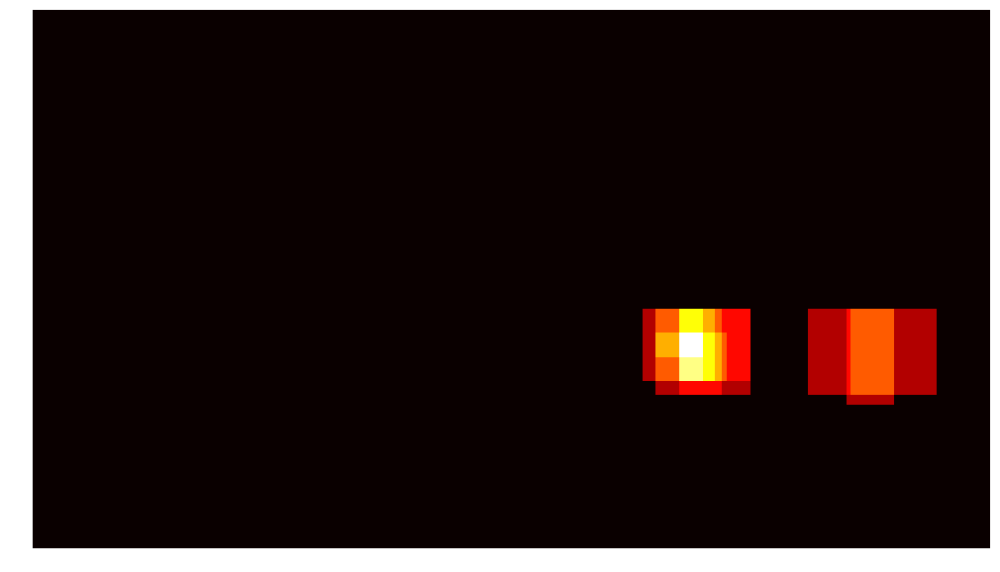

In [43]:
heatmap_img = apply_threshold(heatmap_img, 1.0)
plt.figure(figsize=(25,10))
plt.imshow(heatmap_img, cmap='hot')
plt.axis("off")



2 cars found


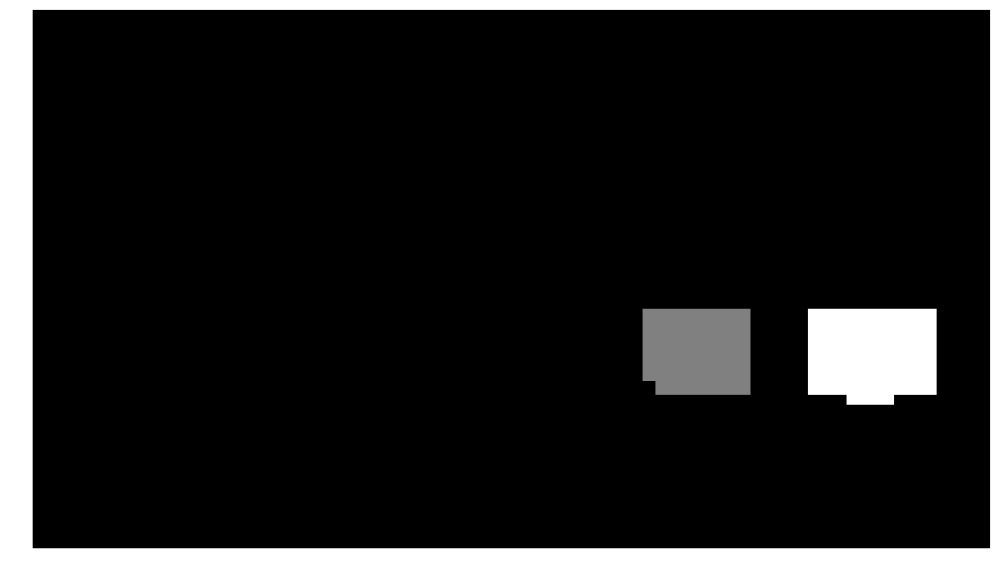

In [44]:

labels = label(heatmap_img)
plt.figure(figsize=(10,10))
plt.figure(figsize=(25,10))
plt.imshow(labels[0], cmap='gray')
plt.axis("off")

print(labels[1], 'cars found')


(-0.5, 1279.5, 719.5, -0.5)

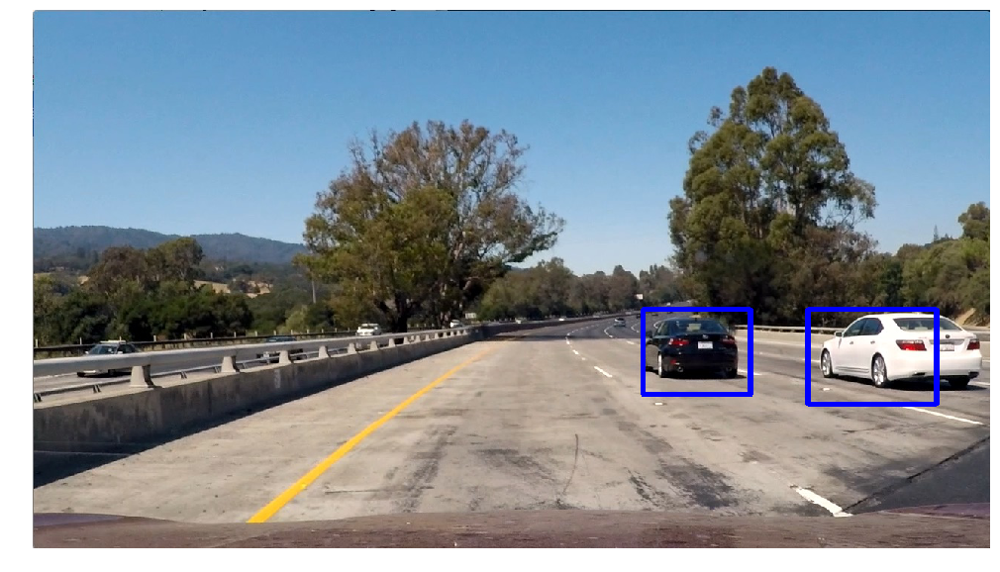

In [45]:

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    rects = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        rects.append(bbox)
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image and final rectangles
    return img, rects

# Draw bounding boxes on a copy of the image
draw_img, rect = draw_labeled_bboxes(np.copy(test_imgs[0]), labels)
# Display the image
plt.figure(figsize=(25,10))
plt.imshow(draw_img)
plt.axis("off")


In [46]:
def process_frame(img):

    rectangles = []
    
    ystart = 400
    ystop = 656
    scale = 1.8
    spatial_size = (32, 32)
    hist_bins = 32
    rectangles.append(find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, cell_per_block, 
                         spatial_size, hist_bins, colorspace))

    ystart = 400
    ystop = 656
    scale = 2.0

    rectangles.append(find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, cell_per_block, 
                         spatial_size, hist_bins, colorspace))



    ystart = 400
    ystop = 656
    scale = 1.0

    rectangles.append(find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, cell_per_block, 
                         spatial_size, hist_bins, colorspace))



    ystart = 400
    ystop = 656
    scale = 1.5

    rectangles.append(find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, cell_per_block, 
                         spatial_size, hist_bins, colorspace))

    recs = []
    for rec in rectangles:
        recs = recs + rec

    rectangles = recs[:]
    
    heatmap_img = np.zeros_like(img[:,:,0])
    heatmap_img = add_heat(heatmap_img, rectangles)
    heatmap_img = apply_threshold(heatmap_img, 1)
    labels = label(heatmap_img)
    draw_img, rects = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img



C:\Users\jaysh\Anaconda3\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


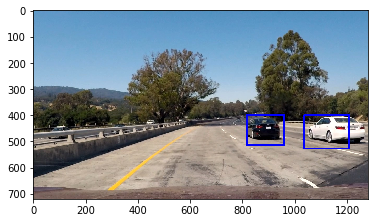

In [47]:
tst_img = process_frame(test_imgs[0])
plt.imshow(tst_img)

In [49]:
class Vehicle_Detect():
    def __init__(self):
        # history of rectangles previous n frames
        self.prev_rects = [] 
        
    def add_rects(self, rects):
        self.prev_rects.append(rects)
        if len(self.prev_rects) > 15:
            # throw out oldest rectangle set(s)
            self.prev_rects = self.prev_rects[len(self.prev_rects)-15:]

In [50]:
def pipeline(img):
    rects = []
    
    ystart = 400
    ystop = 656
    scale = 1.8
    spatial_size = (32, 32)
    hist_bins = 32
    rects.append(find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, cell_per_block, 
                         spatial_size, hist_bins, colorspace))

    ystart = 400
    ystop = 656
    scale = 2.0

    rects.append(find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, cell_per_block, 
                         spatial_size, hist_bins, colorspace))



    ystart = 400
    ystop = 656
    scale = 1.0

    rects.append(find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, cell_per_block, 
                         spatial_size, hist_bins, colorspace))



    ystart = 400
    ystop = 656
    scale = 1.5

    rects.append(find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, cell_per_block, 
                         spatial_size, hist_bins, colorspace))

    recs = []
    for rec in rects:
        recs = recs + rec
    
    rects = recs[:]
    # add detections to the history
    if len(rects) > 0:
        det.add_rects(rects)
    
    heatmap_img = np.zeros_like(img[:,:,0])
    for rect_set in det.prev_rects:
        heatmap_img = add_heat(heatmap_img, rect_set)
    heatmap_img = apply_threshold(heatmap_img, 1 + len(det.prev_rects)//2)
     
    labels = label(heatmap_img)
    draw_img, rect = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img


In [51]:
det = Vehicle_Detect()

proj_out_file = 'test_video_out.mp4'
clip_proj = VideoFileClip('test_video.mp4') #.subclip(23,26)  # subclip = only specified span of video
#clip_proj.save_frame('./test_images/project1.jpg', t=1.0) # saves the frame at time = t seconds
clip_proj_out = clip_proj.fl_image(pipeline)
%time clip_proj_out.write_videofile(proj_out_file, audio=False)

C:\Users\jaysh\Anaconda3\lib\site-packages\moviepy\audio\io\readers.py:110: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  self.nchannels))
C:\Users\jaysh\Anaconda3\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)



MoviePy: building video file test_video_out.mp4
----------------------------------------

Writing video into test_video_out.mp4


  0%|                                                                                           | 0/37 [00:00<?, ?it/s]C:\Users\jaysh\Anaconda3\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)
100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [00:50<00:00,  1.22s/it]


Done writing video in test_video_out.mp4 !
Your video is ready !
Wall time: 53 s


In [52]:
det = Vehicle_Detect()

proj_out_file = 'project_video_out.mp4'
clip_proj = VideoFileClip('project_video.mp4') #.subclip(23,26)  # subclip = only specified span of video
#clip_proj.save_frame('./test_images/project1.jpg', t=1.0) # saves the frame at time = t seconds
clip_proj_out = clip_proj.fl_image(pipeline)
%time clip_proj_out.write_videofile(proj_out_file, audio=False)


C:\Users\jaysh\Anaconda3\lib\site-packages\moviepy\audio\io\readers.py:110: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  self.nchannels))
C:\Users\jaysh\Anaconda3\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)



MoviePy: building video file project_video_out.mp4
----------------------------------------

Writing video into project_video_out.mp4


  0%|                                                                                         | 0/1210 [00:00<?, ?it/s]C:\Users\jaysh\Anaconda3\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)
100%|██████████████████████████████████████████████████████████████████████████████| 1210/1210 [22:12<00:00,  1.09s/it]


Done writing video in project_video_out.mp4 !
Your video is ready !
Wall time: 22min 14s
